<a href="https://colab.research.google.com/github/1up9059/tareas_curso_Curso_imagenes/blob/main/Trabajo_Pr%C3%A1ctico_1_Filtros_lineales_y_no_lineales_optuna_w%26b.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q torch optuna opencv-python-headless wandb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.9/400.9 kB 8.3 MB/s eta 0:00:00


In [2]:
!pip install -qU optuna wandb optuna-integration

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 3.7 MB/s eta 0:00:00


In [3]:
import os
import wandb


In [4]:
from optuna_integration.wandb import WeightsAndBiasesCallback as WandbCallback  # paquete nuevo
SRC = "optuna_integration.wandb"

In [5]:
print("Usando WandbCallback de:", SRC)

Usando WandbCallback de: optuna_integration.wandb


In [6]:
import cv2
import time
import optuna
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import gc
import math
import pandas as pd
from datetime import datetime

In [7]:
device = torch.device("cpu")
print(device)

cpu


In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
eye_path = "/content/drive/MyDrive/analisis_de_imagenes/Tarea_2_inputs/eye_fundus.png"
fishes_path = "/content/drive/MyDrive/analisis_de_imagenes/Tarea_2_inputs/fishes.png"
mri_path = "/content/drive/MyDrive/analisis_de_imagenes/Tarea_2_inputs/mri.png"

img_paths = {"eye": eye_path, "fishes":fishes_path, "mri":mri_path}

# Lectura, muestra y generación de ruido


### Muestra de imagenes

In [10]:
def to_numpy01(img):
  x = img.detach().float().cpu()
  # Escala por máximo local (evita saturación si hay imágenes con ruido fuerte)
  return (x / 255.0).clamp(0, 1).numpy()

def show_triplets(triplets):

    for name, triplet in triplets.items():
        keys = list(triplet.keys())  # ["original", "sp=0.01", "sp=0.05", etc.]

        # Normalización: convierte torch -> numpy y escala [0,255] -> [0,1]

        imgs = [to_numpy01(triplet[k]) for k in keys]

        # Plot
        fig, axes = plt.subplots(1, len(imgs), figsize=(5*len(imgs), 5))
        if len(imgs) == 1:
            axes = [axes]
        for ax, im, k in zip(axes, imgs, keys):
            ax.imshow(im, cmap="gray", vmin=0, vmax=1)  # fuerza escala 0–1
            ax.set_title(f"{name}: {k}")
            ax.axis("off")
        plt.tight_layout()
        plt.show()

### Generación de ruido

In [11]:
@torch.no_grad()
def gaussian_noise(img: torch.Tensor, sigma: float):
    """img: [H,W] 0..255 float; sigma en mismos niveles (p.ej. 10 o 30)"""
    noise = torch.randn_like(img) * float(sigma)
    noisy = img + noise
    return torch.clamp(noisy, 0.0, 255.0)

def salt_and_pepper_noise(img: torch.Tensor, prob: float):
    """prob en [0,1]; reparte mitad sal y mitad pimienta"""
    r = torch.rand_like(img)
    out = img.clone()
    out[r < prob * 0.5] = 0.0      # pimienta
    out[r > 1.0 - prob * 0.5] = 255.0  # sal
    return out

def psnr(ref: torch.Tensor, test: torch.Tensor):
    ref = ref.float()
    test = test.float()
    mse = torch.mean((ref - test) ** 2)
    if mse <= 0:
        return float("inf")
    return 10.0 * math.log10((255.0 ** 2) / mse.item())

### Lectura de imagenes

In [12]:
def read_images_gray(paths: dict, device=device):
    imgs = {}
    for name, p in paths.items():
        im = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
        if im is None:
            raise FileNotFoundError(f"No pude leer {p}")
        t = torch.from_numpy(im).float().to(device)
        imgs[name] = t
    return imgs

#plt.imshow(imgs_dict['mri'], cmap='gray')
#plt.axis("off")  # oculta los ejes
#plt.show()

In [13]:
imgs = read_images_gray(img_paths)
imgs_keys = list(imgs.keys())
imgs_keys

['eye', 'fishes', 'mri']

# Aplicando ruido *Salt* and *Pepper*

## Parametros:

In [14]:
SP_LOW_TRESH = 0.05
SP_HIGH_TRESH = 0.2
probs = [SP_LOW_TRESH, SP_HIGH_TRESH]

## Aplicación de funciones de ruido

In [15]:
spn_imgs = {key: {f"sp_prob={float(p)}": salt_and_pepper_noise(img.cpu(), float(p)) for p in probs} for key, img in imgs.items()}
sppsnr_v = {key: {f"sp_prob={float(p)}": psnr(img.cpu(), spn_imgs[key][f"sp_prob={float(p)}"]) for p in probs}for key, img in imgs.items()}
spkeys = list(spn_imgs[imgs_keys[0]].keys())
spkeys

['sp_prob=0.05', 'sp_prob=0.2']

### Guardado y muestra de resultados

In [16]:
sp_triplets = {"eye": {f'original': imgs[imgs_keys[0]], f'{spkeys[0]}' :spn_imgs[imgs_keys[0]][spkeys[0]], f'{spkeys[1]}':spn_imgs[imgs_keys[0]][spkeys[1]]},
            "fishes":   {f'original': imgs[imgs_keys[1]], f'{spkeys[0]}' :spn_imgs[imgs_keys[1]][spkeys[0]], f'{spkeys[1]}':spn_imgs[imgs_keys[1]][spkeys[1]]},
            "mri": {f'original': imgs[imgs_keys[2]], f'{spkeys[0]}': spn_imgs[imgs_keys[2]][spkeys[0]], f'{spkeys[1]}':spn_imgs[imgs_keys[2]][spkeys[1]]}}
sp_triplets_keys = list(sp_triplets[f'{imgs_keys[0]}'].keys())
#sp_triplets_keys
#plt.imshow(sp_triplets['eye'][spkeys[0]], cmap='gray')
#plt.axis("off")  # oculta los ejes
#plt.show()

### Manejo de Keys para imagenes de ruido Salt & Pepper

In [17]:
imgs_keys

['eye', 'fishes', 'mri']

In [18]:
sp_triplets_keys

['original', 'sp_prob=0.05', 'sp_prob=0.2']

**Main dictionary:**

"eye" = img_keys[0]

"fishes" = img_keys[1]

'mri' = img_keys[2]

**Sub dictionary**

"original" = sp_triplets_keys[0]

"sp_prob=0.05" = sp_triplets_keys[1]

"sp_prob=0.2" = sp_triplets_keys[2]

**Entonces un llamado será:**

sp_triplets[img_keys[0]][sp_triplets_keys[1]] = sp_triplets["eye"]["sp_prob=0.05"]

### Muestra e resultados de ruido Salt & Pepper

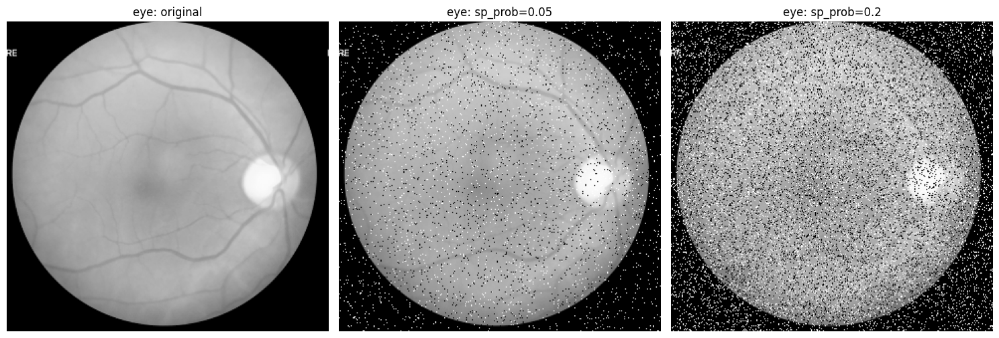

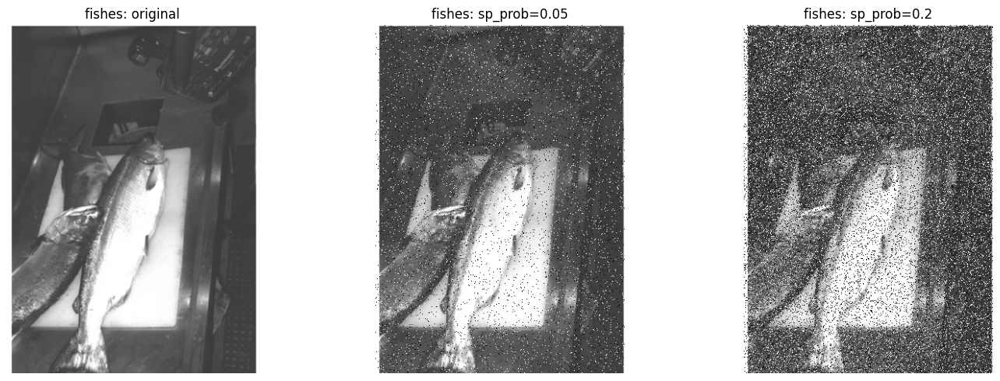

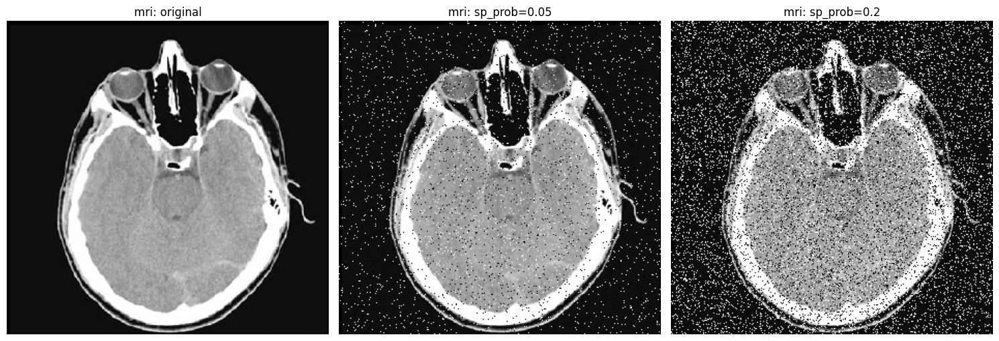

In [19]:
show_triplets(sp_triplets)

# Aplicación de ruido *Gaussiano*

## Parametros de ruido:

In [20]:
GN_LOW_TRESH = 10.0
GN_HIGH_TRESH = 30.0
sigmas = [GN_LOW_TRESH, GN_HIGH_TRESH]

## Aplicación de ruido

In [21]:
gn_imgs = {key: {f"gn_sigma={float(s)}": gaussian_noise(img.cpu(), s) for s in sigmas} for key, img in imgs.items()}
gpsnr_v = {key: {f"gn_sigma={float(s)}": psnr(img.cpu(), gn_imgs[key][f"gn_sigma={float(s)}"]) for s in sigmas} for key, img in imgs.items()}
gnkeys = list(gn_imgs[imgs_keys[0]].keys())
gnkeys

['gn_sigma=10.0', 'gn_sigma=30.0']

### Guardado y muestra de resultados

In [22]:
gn_triplets = {"eye": {"original": imgs[imgs_keys[0]], f"{gnkeys[0]}":gn_imgs[imgs_keys[0]][gnkeys[0]], f"{gnkeys[1]}": gn_imgs[imgs_keys[0]][gnkeys[1]]},
            "fishes": {"original": imgs[imgs_keys[1]], f"{gnkeys[0]}": gn_imgs[imgs_keys[1]][gnkeys[0]], f"{gnkeys[1]}": gn_imgs[imgs_keys[1]][gnkeys[1]]},
            "mri": {"original": imgs[imgs_keys[2]], f"{gnkeys[0]}": gn_imgs[imgs_keys[2]][gnkeys[0]], f"{gnkeys[1]}": gn_imgs[imgs_keys[2]][gnkeys[1]]}}
gn_triplets_keys = list(gn_triplets[f'{imgs_keys[0]}'].keys())
gn_triplets_keys
#plt.imshow(gn_triplets[imgs_keys[0]][gnkeys[0]], cmap='gray')
#plt.axis("off")  # oculta los ejes
#plt.show()

['original', 'gn_sigma=10.0', 'gn_sigma=30.0']

### Manejo de Keys para imagenes de ruido Gussiano

In [23]:
imgs_keys

['eye', 'fishes', 'mri']

In [24]:
gn_triplets_keys

['original', 'gn_sigma=10.0', 'gn_sigma=30.0']

**Main dictionary:**

"eye" = img_keys[0]

"fishes" = img_keys[1]

'mri' = img_keys[2]

**Sub dictionary**

"original" = gn_triplets_keys[0]

"gn_sigma=10.0" = gn_triplets_keys[1]

"gn_sigma=30.0" = gn_triplets_keys[2]

**Entonces un llamado será:**

gn_triplets[img_keys[0]][gn_triplets_keys[1]] = gn_triplets["eye"]["gn_sigma=10.0"]

### Muestra de resultados de ruido gaussiano

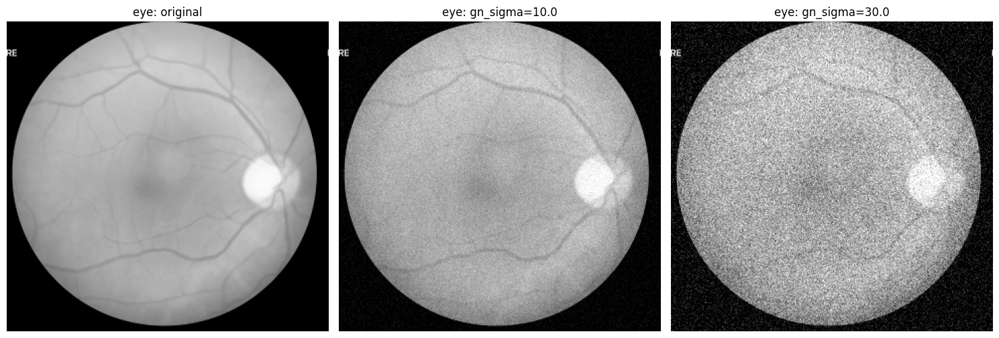

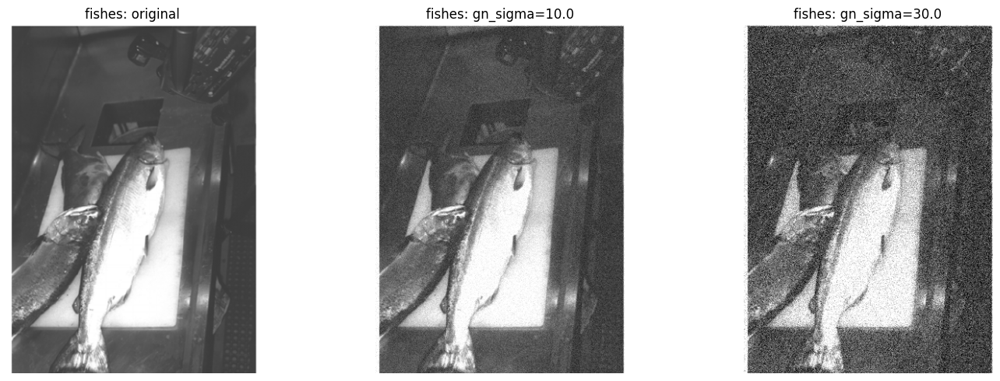

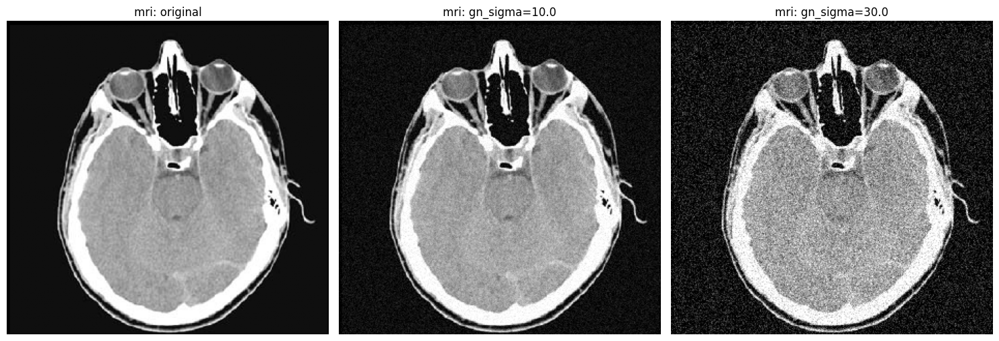

In [25]:
show_triplets(gn_triplets)


# 2. Filtros no lineales para eliminación de Ruido.

Para las 3 imagenes provistas con los dos escenarios de ruido Gaussiano y los dos escenarios de ruido de sal y pimienta implemente y pruebe las siguientes funciones:


## Enunciado:
 1. Implemente el filtro Bilateral y el filtro de promediado No local.

   a. Para el filtro Bilateral defina la ventana de $NxN$ dimensiones con la desviación estandar espacial definida como:

   $$
   \sigma_{s} = \frac{N-1}{4}
   $$

   y reciba además la desviación estanadar en el dominio de la intensidad $\sigma_{r}$


   b. Para el filtro de promediado no local, reciba la desviación estandar en el dominio de similitud de vecidarios $\sigma_{r}$. Implemente la variante simplificada sin ventana Gaussiana

## Fuciones útiles para implementación de filtros

In [26]:
def snr_db(original: torch.Tensor, filtered: torch.Tensor) -> float:
    """SNR en dB entre original y filtrada. Acepta 0..1 o 0..255."""
    x = original.detach().float().cpu()
    y = filtered.detach().float().cpu()
    noise = x - y
    signal_power = torch.sum(x * x)
    noise_power  = torch.sum(noise * noise)
    if noise_power <= 0:
        return float("inf")
    return 10.0 * math.log10((signal_power.item() + 1e-12) / (noise_power.item() + 1e-12))

In [27]:
def norm(t):
  # normaliza a [0,1] asumiendo 0..255 ó 0..1 de entrada
  m = float(t.max())
  if m <= 1.001:
    return t.numpy()
  return (t / 255.0).numpy()

def debug_effect(orig, noisy, den, title1="", title2=""):
    orig = orig.detach().float().cpu()
    noisy = noisy.detach().float().cpu()
    den = den.detach().float().cpu()
    dff_den_noi = den - noisy
    dff_den_orig = den - orig
    PSNR_noisy_vs_orig = psnr(noisy, orig)
    PSNR_filtered_vs_orig = psnr(orig, den)

        # Diccionario con métricas
    data = {
        "original": title1,
        "filter": title2,
        "min_origianl": float(orig.min()),
        "max_original": float(orig.max()),
        "min_denoised": float(den.min()),
        "max_denoised": float(den.max()),
        "max_abs_diff": float(dff_den_noi .max()),
        "PSNR_noisy_vs_orig": psnr(noisy, orig),
        "PSNR_den_vs_orig":  psnr(den, orig),
        "ΔPSNR": psnr(den,orig) - psnr(noisy,orig),
        "SNR_db(noisy, orig)": snr_db(noisy, orig),
        "SNR_db(den, orig)": snr_db(den, orig),
        "ΔSNR(dB)": snr_db(orig, den) - snr_db(orig, noisy),
        }
    df = pd.DataFrame([data])

    plt.figure(figsize=(13,5))
    plt.subplot(1,5,1)
    plt.imshow(norm(orig), cmap="gray", vmin=0, vmax=1); plt.title("original", fontsize=8); plt.axis("off")
    plt.subplot(1,5,2)
    plt.imshow(norm(noisy), cmap="gray", vmin=0, vmax=1); plt.title(f"noisy {title1}", fontsize=8); plt.axis("off")
    plt.subplot(1,5,3)
    plt.imshow(norm(den), cmap="gray", vmin=0, vmax=1); plt.title(f"deno {title2}", fontsize=8); plt.axis("off")
    plt.subplot(1,5,4)
    dff_den_noi = dff_den_noi / dff_den_noi.max().clamp_min(1e-6)
    plt.imshow(dff_den_noi.numpy(), cmap="gray", vmin=0, vmax=1); plt.title("|deno-noi| norm", fontsize=8); plt.axis("off")
    plt.subplot(1,5,5)
    dff_den_orig = dff_den_orig / dff_den_orig.max().clamp_min(1e-6)
    plt.imshow(dff_den_orig.numpy(), cmap="gray", vmin=0, vmax=1); plt.title("|deno-orig| norm",fontsize=8); plt.axis("off")
    plt.tight_layout()
    plt.show()

    return df

In [28]:
def _resolve_scale(img):
    """Devuelve (img_float, scale) donde scale es 1 o 255."""
    x = img.detach().float()
    scale = 1.0 if x.max() <= 1.001 else 255.0
    return x, scale

## Solución a.

## Implementación Filtro Bilateral

In [29]:
@torch.no_grad()
def bilateral_filter(img2d: torch.Tensor, N: int = 11, sigma_r: float = 25.0, sigma_r_rel: bool=False) -> torch.Tensor:
    """
    Filtro Bilateral vectorizado para imagen 2D en escala de grises.
    - img2d: [H, W] float en 0..255
    - N: tamaño impar de la ventana (3, 5, 7, 11, ...)
    - sigma_r: sigma del kernel de rango (en unidades de intensidad 0..255)
    - sigma_s: se fija como (N-1)/4 (según instrucciones del práctico)
    """
    assert img2d.ndim == 2, "La imagen debe ser H×W (2D)."
    N = int(N) | 1  # forzar impar
    r = N // 2


    #x = img2d.to(torch.float32)
    x, scale = _resolve_scale(img2d)  # x en misma escala que llegó
    H, W = x.shape
    device, dtype = x.device, x.dtype


    if sigma_r_rel:
        sigma_r_eff = sigma_r * scale
    else:
        sigma_r_eff = sigma_r

    # Extraer parches: (1, K, L) con K=N*N y L=H*W
    x4 = x.unsqueeze(0).unsqueeze(0)                      # [1,1,H,W]
    patches = F.unfold(x4, kernel_size=N, padding=r)      # [1,K,L]
    K, L = patches.shape[1], patches.shape[2]

    # Centro de cada vecindario (1,1,L)
    center_idx = K // 2
    centers = patches[:, center_idx:center_idx+1, :]      # [1,1,L]

    # Kernel espacial gaussiano con sigma_s = (N-1)/4
    sigma_s = (N - 1) / 4.0
    ax = torch.arange(-r, r+1, device=device, dtype=dtype)
    yy, xx = torch.meshgrid(ax, ax, indexing='ij')
    spatial = torch.exp(-(xx**2 + yy**2) / (2.0 * (sigma_s**2) + 1e-12)).reshape(1, K, 1)  # [1,K,1]

    # Kernel de rango (intensidad)
    range_w = torch.exp(-((patches - centers) ** 2) / (2.0 * (sigma_r**2) + 1e-12))        # [1,K,L]

    # Ponderación total y normalización
    weights = spatial * range_w + 1e-12          # [1,K,L]
    num = (weights * patches).sum(dim=1, keepdim=True)  # [1,1,L]
    den = weights.sum(dim=1, keepdim=True)              # [1,1,L]
    cols = num / den                                    # [1,1,L]

    # Regresar a [H,W] y recortar a 0..255
    out = cols.view(1, 1, H, W).squeeze()
    return torch.clamp(out, 0.0, 255.0)

In [30]:
def apply_bilateral(sp_triplets: dict, N: int = 11, sigma_r: float = 25.0, sigma_r_rel: bool=False):
    """
    Aplica el bilateral (con σs = (N-1)/4) a TODAS las entradas NO 'original' de cada grupo.
    Mantiene 'original' sin tocar.
    Estructura esperada:
      sp_triplets = {"eye": {"original": img, "<ruido1>": img_r1, ...}, "fish": {...}, "mri": {...}}
    """
    out = {}
    for name, trip in sp_triplets.items():
      out[name] = {}
      for k, img in trip.items():
            if k.lower() == "original":
              out[name][f'{k}'] = img.detach().float()
            else:

              out[name][f'{k} - BI, N:{N}, sg_r: {sigma_r}'] = bilateral_filter(img, N=N, sigma_r=sigma_r, sigma_r_rel=sigma_r_rel)
    return out

### Aplicación de filtro Biltateral

In [31]:
bilat_gn_triplets = apply_bilateral(gn_triplets, N=21, sigma_r=25, sigma_r_rel=True)

In [32]:
bilat_sp_triplets = apply_bilateral(sp_triplets, N=21, sigma_r=25, sigma_r_rel=True)

## Comparativa Filtro Bilateral - Ruido Salt & Pepper

#### Manejo de Keys de resultados para análisis Filtro Bilateral - Ruido Salt & Pepper

**Filtro bilateral - Salt and Pepper**

Example aplicación filtro bilateral a ruido sal y pimienta:

In [33]:
bi_sp_imgs_keys = list(bilat_sp_triplets.keys())
bi_sp_out_keys =list(bilat_sp_triplets[bi_sp_imgs_keys[0]].keys())


In [34]:
print(bi_sp_imgs_keys)
print(bi_sp_out_keys)

['eye', 'fishes', 'mri']
['original', 'sp_prob=0.05 - BI, N:21, sg_r: 25', 'sp_prob=0.2 - BI, N:21, sg_r: 25']


**Main dictionary**:

*"eye"* = bi_sp_imgs_keys[0]

*"fish"* = bi_sp_imgs_keys[1]

*"mri"* = bi_sp_imgs_keys[2]



**Sub dictionary**:

*"original"* = bi_sp_out_keys[0]

*"sp prob=0.05 - BI, N:21, sg_r: 25"* = bi_sp_out_keys[1]

*'sp prob=0.2 - BI, N:21, sg_r: 25"* = bi_sp_out_keys[2]


**Entonces un llamado será:**

bilat_sp_triplets[bi_sp_imgs_keys[0]][bi_sp_out_keys[1]] = bilat_sp_triplets["eye"]["sp prob=0.05 - BI, N:21, sg_r: 25"]

### Comparativa Filtro Bilateral - Salt & Pepper Noise

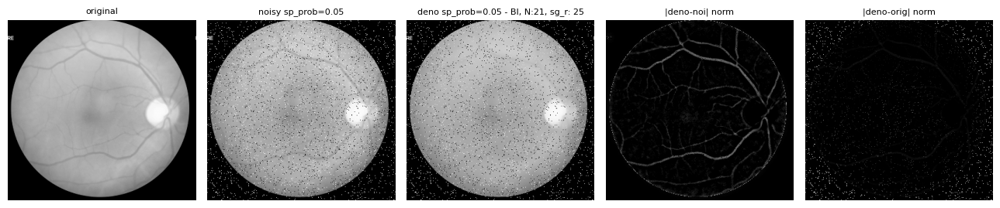

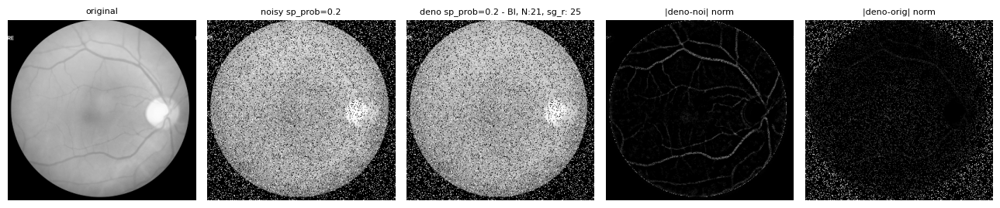

In [35]:
eye_spbi_dfs = []
for i in range(1,3):
  or_sp = sp_triplets[imgs_keys[0]][sp_triplets_keys[0]]
  n_sp = sp_triplets[imgs_keys[0]][sp_triplets_keys[i]]
  f_spbi = bilat_sp_triplets[imgs_keys[0]][bi_sp_out_keys[i]]
  eye_spbi_df = debug_effect(or_sp,
                            n_sp,
                            f_spbi,
                            title1=f"{sp_triplets_keys[i]}", title2= f"{bi_sp_out_keys[i]}")
  eye_spbi_dfs.append(eye_spbi_df)

eye_spbi_df = pd.concat(eye_spbi_dfs, ignore_index=True)

In [36]:
eye_spbi_df

,original,filter,min_origianl,max_original,min_denoised,max_denoised,max_abs_diff,PSNR_noisy_vs_orig,PSNR_den_vs_orig,ΔPSNR,"SNR_db(noisy, orig)","SNR_db(den, orig)",ΔSNR(dB)
0,sp_prob=0.05,"sp_prob=0.05 - BI, N:21, sg_r: 25",0.0,251.0,1.745118e-12,255.0,37.236130,17.599239,17.679588,0.080349,13.005942,13.063755,0.080349
1,sp_prob=0.2,"sp_prob=0.2 - BI, N:21, sg_r: 25",0.0,251.0,1.613930e-11,255.0,37.460144,11.571636,11.615076,0.043440,7.284627,7.297177,0.043440


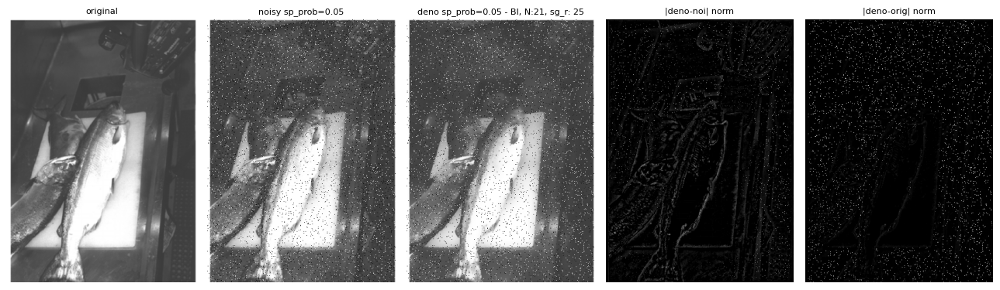

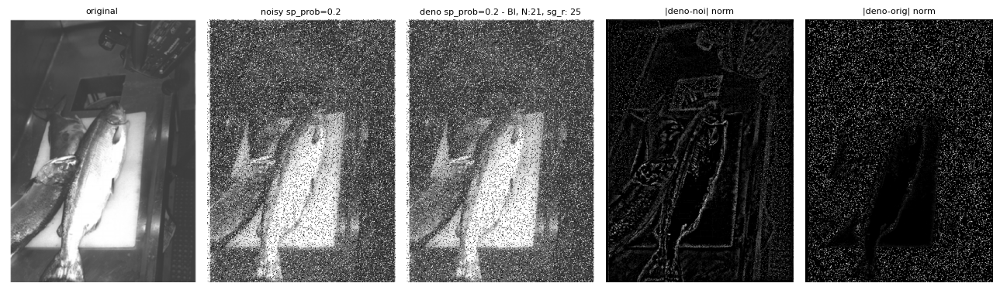

In [37]:
fishes_spbi_dfs = []
for i in range(1,3):
  or_sp = sp_triplets[imgs_keys[1]][sp_triplets_keys[0]]
  n_sp = sp_triplets[imgs_keys[1]][sp_triplets_keys[i]]
  f_spbi = bilat_sp_triplets[imgs_keys[1]][bi_sp_out_keys[i]]
  fishes_spbi_df = debug_effect(or_sp,
                            n_sp,
                            f_spbi,
                            title1=f"{sp_triplets_keys[i]}", title2= f"{bi_sp_out_keys[i]}")
  fishes_spbi_dfs.append(fishes_spbi_df)

fish_spbi_df = pd.concat(fishes_spbi_dfs, ignore_index=True)

In [38]:
fish_spbi_df

,original,filter,min_origianl,max_original,min_denoised,max_denoised,max_abs_diff,PSNR_noisy_vs_orig,PSNR_den_vs_orig,ΔPSNR,"SNR_db(noisy, orig)","SNR_db(den, orig)",ΔSNR(dB)
0,sp_prob=0.05,"sp_prob=0.05 - BI, N:21, sg_r: 25",51.0,255.0,1.386414e-08,255.0,50.433178,17.941515,18.101078,0.159564,12.206897,12.336070,0.159564
1,sp_prob=0.2,"sp_prob=0.2 - BI, N:21, sg_r: 25",51.0,255.0,4.619533e-09,255.0,28.818161,11.945753,12.036912,0.091158,6.786783,6.848718,0.091158


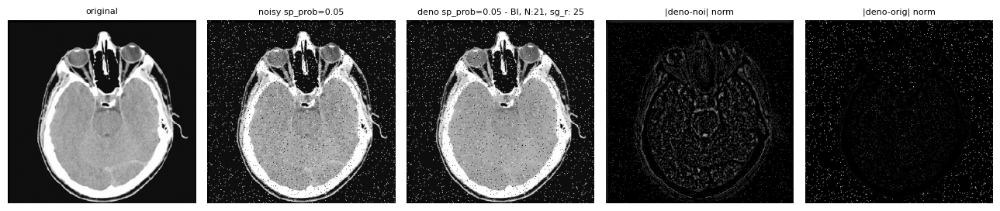

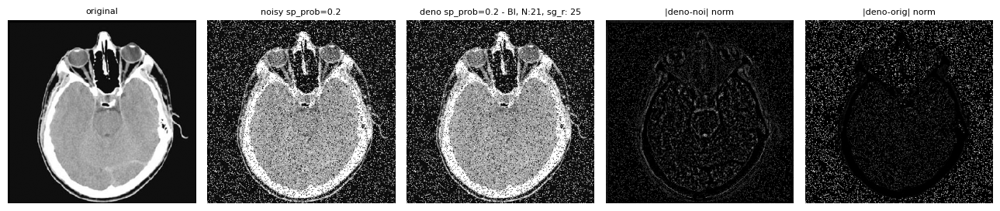

In [39]:
mri_spbi_dfs = []
for i in range(1,3):
  or_sp = sp_triplets[imgs_keys[2]][sp_triplets_keys[0]]
  n_sp = sp_triplets[imgs_keys[2]][sp_triplets_keys[i]]
  f_spbi = bilat_sp_triplets[imgs_keys[2]][bi_sp_out_keys[i]]
  mri_spbi_df = debug_effect(or_sp,
                            n_sp,
                            f_spbi,
                            title1=f"{sp_triplets_keys[i]}", title2= f"{bi_sp_out_keys[i]}")
  mri_spbi_dfs.append(mri_spbi_df)

mri_spbi_df = pd.concat(mri_spbi_dfs, ignore_index=True)

In [40]:
mri_spbi_df

,original,filter,min_origianl,max_original,min_denoised,max_denoised,max_abs_diff,PSNR_noisy_vs_orig,PSNR_den_vs_orig,ΔPSNR,"SNR_db(noisy, orig)","SNR_db(den, orig)",ΔSNR(dB)
0,sp_prob=0.05,"sp_prob=0.05 - BI, N:21, sg_r: 25",0.0,255.0,4.618503e-07,255.0,37.822311,17.095237,17.131087,0.035850,11.059589,11.071152,0.035851
1,sp_prob=0.2,"sp_prob=0.2 - BI, N:21, sg_r: 25",0.0,255.0,3.086401e-08,255.0,37.937653,11.106895,11.157721,0.050826,5.716984,5.749731,0.050826


## Comparativa Filtro Bilateral - Ruido Gaussiano


### Manejo de Keys de resultados para análisis Filtro Bilateral - Ruido Gaussiano

In [41]:
bi_gn_imgs_keys = list(bilat_gn_triplets.keys())
bi_gn_out_keys =list(bilat_gn_triplets[bi_gn_imgs_keys[0]].keys())

In [42]:
print(bi_gn_imgs_keys)
print(bi_gn_out_keys)

['eye', 'fishes', 'mri']
['original', 'gn_sigma=10.0 - BI, N:21, sg_r: 25', 'gn_sigma=30.0 - BI, N:21, sg_r: 25']


Main dictionary:

*"eye"* = bi_gn_imgs_keys[0]

*"fish"* = bi_gn_imgs_keys[1]

*"mri"* = bi_gn_imgs_keys[2]


Sub dictionary:

*"original"* = bi_gn_out_keys[0]

*"gn sigma = 10.0 - BI, N:21, sg_r: 25"* = bi_gn_out_keys[1]

*"gn sigma = 30.0 - BI, N:21, sg_r: 25"* = bi_gn_out_keys[2]

Entonces un llamado será:

bilat_gn_triplets[bi_gn_imgs_keys[0]][bi_gn_out_keys[1]] = bilat_gn_triplets["eye"]["gn sigma" = 10.0 - BI, N:21, sg_r: 25"]

### Comparativa Filtro Bilateral - Gaussian Noise

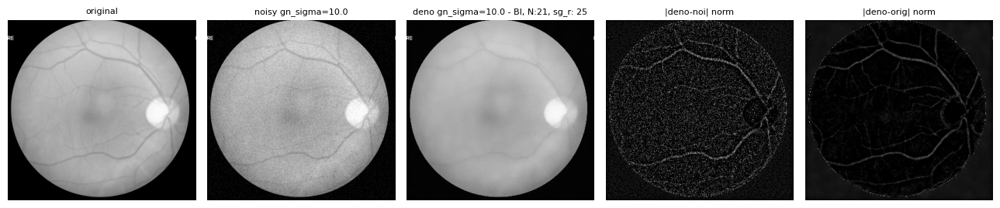

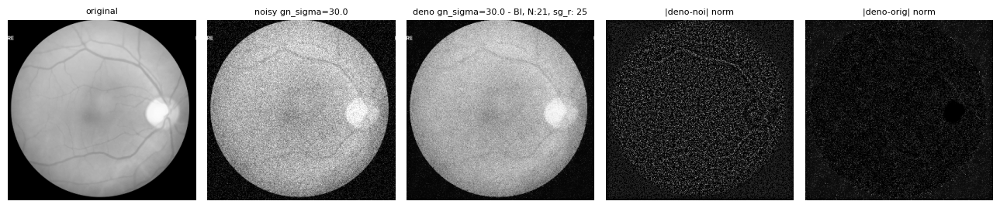

In [43]:
eye_gnbi_dfs = []

for j in range(1,3):
  or_gn = gn_triplets[imgs_keys[0]][gn_triplets_keys[0]]
  n_gn = gn_triplets[imgs_keys[0]][gn_triplets_keys[j]]
  f_gnbi = bilat_gn_triplets[imgs_keys[0]][bi_gn_out_keys[j]]
  eye_gnbi_df = debug_effect(or_gn,
                             n_gn,
                             f_gnbi,
                             title1=f"{gn_triplets_keys[j]}", title2= f"{bi_gn_out_keys[j]}")
  eye_gnbi_dfs.append(eye_gnbi_df)

eye_gnbi_df = pd.concat(eye_gnbi_dfs, ignore_index=True)

In [44]:
eye_gnbi_df

,original,filter,min_origianl,max_original,min_denoised,max_denoised,max_abs_diff,PSNR_noisy_vs_orig,PSNR_den_vs_orig,ΔPSNR,"SNR_db(noisy, orig)","SNR_db(den, orig)",ΔSNR(dB)
0,gn_sigma=10.0,"gn_sigma=10.0 - BI, N:21, sg_r: 25",0.0,251.0,0.893855,249.213058,37.013329,28.780727,35.759362,6.978636,24.106339,31.069722,6.978636
1,gn_sigma=30.0,"gn_sigma=30.0 - BI, N:21, sg_r: 25",0.0,251.0,1.068075,248.344299,37.161606,19.290658,23.410689,4.120030,14.738677,18.767739,4.120030


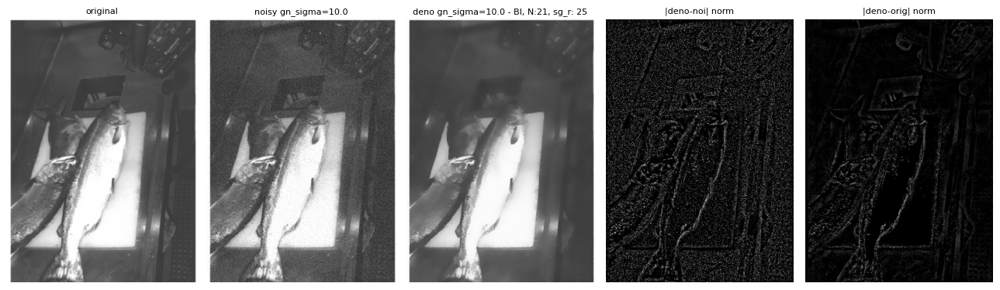

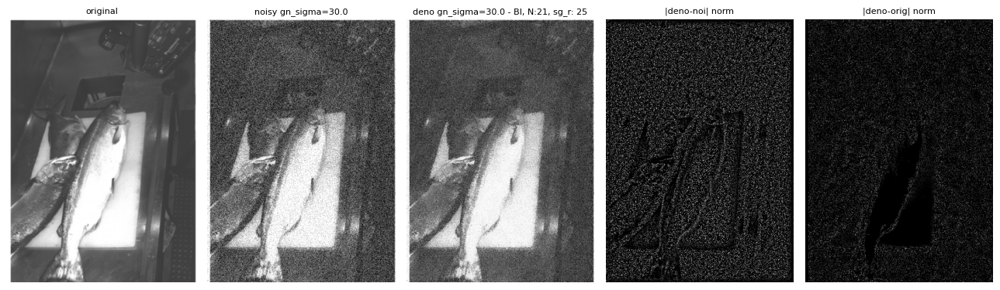

In [45]:
fishes_gnbi_dfs = []

for j in range(1,3):
  or_gn = gn_triplets[imgs_keys[1]][gn_triplets_keys[0]]
  n_gn = gn_triplets[imgs_keys[1]][gn_triplets_keys[j]]
  f_gnbi = bilat_gn_triplets[imgs_keys[1]][bi_gn_out_keys[j]]
  fishes_gnbi_df = debug_effect(or_gn,
                                n_gn,
                                f_gnbi,
                                title1=f"{gn_triplets_keys[j]}", title2= f"{bi_gn_out_keys[j]}")
  fishes_gnbi_dfs.append(fishes_gnbi_df)

fishes_gnbi_df = pd.concat(fishes_gnbi_dfs, ignore_index=True)

In [46]:
fishes_gnbi_df

,original,filter,min_origianl,max_original,min_denoised,max_denoised,max_abs_diff,PSNR_noisy_vs_orig,PSNR_den_vs_orig,ΔPSNR,"SNR_db(noisy, orig)","SNR_db(den, orig)",ΔSNR(dB)
0,gn_sigma=10.0,"gn_sigma=10.0 - BI, N:21, sg_r: 25",51.0,255.0,29.597700,253.101135,36.927227,28.352732,32.978633,4.625901,22.387223,26.966087,4.625901
1,gn_sigma=30.0,"gn_sigma=30.0 - BI, N:21, sg_r: 25",51.0,255.0,4.206769,251.094971,36.680122,18.923718,22.360456,3.436738,13.022381,16.339076,3.436738


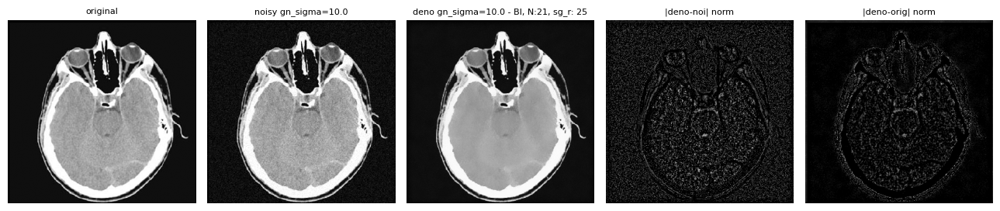

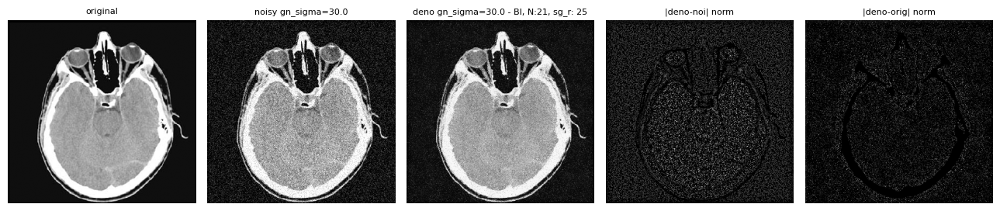

In [47]:
mri_gnbi_dfs = []

for k in range(1,3):
  or_gn = gn_triplets[imgs_keys[2]][gn_triplets_keys[0]]
  n_gn = gn_triplets[imgs_keys[2]][gn_triplets_keys[k]]
  f_gnbi = bilat_gn_triplets[imgs_keys[2]][bi_gn_out_keys[k]]
  mri_gnbi_df = debug_effect(or_gn,
                                n_gn,
                                f_gnbi,
                                title1=f"{gn_triplets_keys[k]}", title2= f"{bi_gn_out_keys[k]}")
  mri_gnbi_dfs.append(mri_gnbi_df)

mri_gnbi_df = pd.concat(mri_gnbi_dfs, ignore_index=True)

In [48]:
mri_gnbi_df

,original,filter,min_origianl,max_original,min_denoised,max_denoised,max_abs_diff,PSNR_noisy_vs_orig,PSNR_den_vs_orig,ΔPSNR,"SNR_db(noisy, orig)","SNR_db(den, orig)",ΔSNR(dB)
0,gn_sigma=10.0,"gn_sigma=10.0 - BI, N:21, sg_r: 25",0.0,255.0,1.688095,251.359009,37.986069,28.667524,32.070905,3.403381,22.379879,25.744213,3.403381
1,gn_sigma=30.0,"gn_sigma=30.0 - BI, N:21, sg_r: 25",0.0,255.0,1.642434,249.498978,37.698769,19.977532,23.269740,3.292208,13.769627,16.948705,3.292208


## Implementación Filtro NLM

In [49]:
@torch.no_grad()
def nlm_filter(img2d: torch.Tensor, S: int = 13, sigma_r: float = 25.0, sigma_r_rel: bool=False) -> torch.Tensor:
    """
    NLM simplificado (sin gauss espacial). Acepta 0..1 o 0..255.
    """
    assert img2d.ndim == 2, "Esperaba imagen 2D HxW"
    S = int(S) | 1
    r = S // 2
    x, scale = _resolve_scale(img2d)
    H, W = x.shape

    sigma_r_eff = sigma_r * scale if sigma_r_rel else sigma_r

    x4 = x.unsqueeze(0).unsqueeze(0)                          # [1,1,H,W]
    neigh = F.unfold(x4, kernel_size=S, padding=r)            # [1,S*S,H*W]
    centers = x4.view(1, 1, -1)                               # [1,1,H*W]

    weights = torch.exp(-((neigh - centers) ** 2) / (2.0 * (sigma_r_eff**2) + 1e-12))
    num = (weights * neigh).sum(dim=1)
    den = weights.sum(dim=1) + 1e-12
    out = (num / den).view(H, W)
    return torch.clamp(out, 0.0, scale)

In [50]:
def apply_nlm(sp_triplets: dict, S: int = 13, sigma_r: float = 25.0, sigma_r_rel: bool=False):
    out = {}
    for name, trip in sp_triplets.items():
        out[name] = {}
        for k, img in trip.items():
            if k.lower() == "original":
                out[name][k] = img.detach().float()
            else:
                out[name][f'{k} - NLM, S:{S}, sg_r: {sigma_r}'] = nlm_filter(img, S=S, sigma_r=sigma_r, sigma_r_rel=sigma_r_rel)
    return out

### Aplicación filtro NLM

Las siguientes 2 celdas aplican la función *apply_nlm* a *sp_triplets* y *gn_triples*

In [51]:
nlm_sp_triplets = apply_nlm(sp_triplets, S=21, sigma_r=25.0, sigma_r_rel=False)

In [52]:
nlm_gn_triplets = apply_nlm(gn_triplets, S=21, sigma_r=25.0, sigma_r_rel=False)

## Comparativa Filtro NLM - Ruido Salt & Pepper

#### Manejo de Keys de resultados para análisis Filtro NLM - Ruido Salt & Pepper

In [53]:
nlm_sp_imgs_keys = list(nlm_sp_triplets.keys())
nlm_sp_out_keys =list(nlm_sp_triplets[bi_sp_imgs_keys[0]].keys())

In [54]:
print(nlm_sp_imgs_keys)
print(nlm_sp_out_keys)

['eye', 'fishes', 'mri']
['original', 'sp_prob=0.05 - NLM, S:21, sg_r: 25.0', 'sp_prob=0.2 - NLM, S:21, sg_r: 25.0']


**Main dictionary**:

*"eye"* = nlm_sp_imgs_keys[0]

*"fish"* = nlm_sp_imgs_keys[1]

*"mri"* = nlm_sp_imgs_keys[2]



**Sub dictionary**:

*"original"* = nlm_sp_out_keys[0]

*"sp prob=0.05 - BI, N:21, sg_r: 25"* = nlm_sp_out_keys[1]

*"sp prob=0.2 - BI, N:21, sg_r: 25"* = nlm_sp_out_keys[2]


Entonces un llamado será:

nlm_sp_triplets[nlm_sp_imgs_keys[0]][nlm_sp_out_keys[1]] = bilat_gn_triplets["eye"][sp prob=0.05 - BI, N:21, sg_r: 25"]

#### Comparativa Filtro NLM - Salt & Pepper Noise

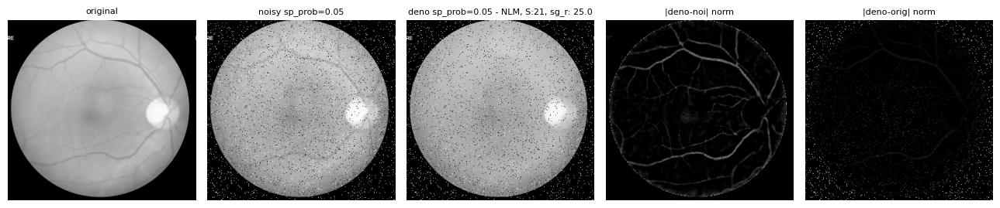

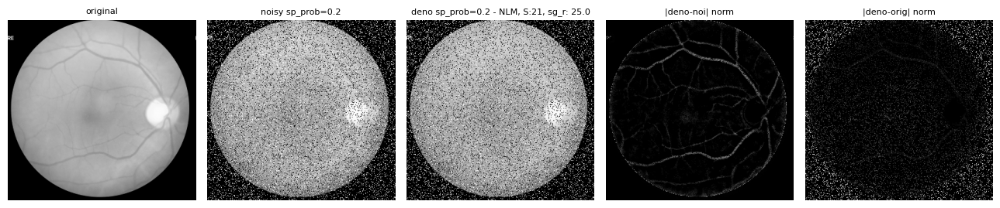

In [55]:
eye_spnlm_dfs = []

for i in range(1,3):
  or_sp = sp_triplets[imgs_keys[0]][sp_triplets_keys[0]]
  n_sp = sp_triplets[imgs_keys[0]][sp_triplets_keys[i]]
  f_spnlm = nlm_sp_triplets[imgs_keys[0]][nlm_sp_out_keys[i]]
  eye_spnlm_df = debug_effect(or_sp,
                              n_sp,
                              f_spnlm,
                              title1=f"{sp_triplets_keys[i]}", title2= f"{nlm_sp_out_keys[i]}")

  eye_spnlm_dfs.append(eye_spnlm_df)

eye_spnlm_df = pd.concat(eye_spnlm_dfs, ignore_index=True)

In [56]:
eye_spnlm_df

,original,filter,min_origianl,max_original,min_denoised,max_denoised,max_abs_diff,PSNR_noisy_vs_orig,PSNR_den_vs_orig,ΔPSNR,"SNR_db(noisy, orig)","SNR_db(den, orig)",ΔSNR(dB)
0,sp_prob=0.05,"sp_prob=0.05 - NLM, S:21, sg_r: 25.0",0.0,251.0,1.482820e-23,255.0,42.425156,17.599239,17.676956,0.077717,13.005942,13.061235,0.077717
1,sp_prob=0.2,"sp_prob=0.2 - NLM, S:21, sg_r: 25.0",0.0,251.0,1.359252e-22,255.0,42.125351,11.571636,11.614245,0.042608,7.284627,7.297210,0.042608


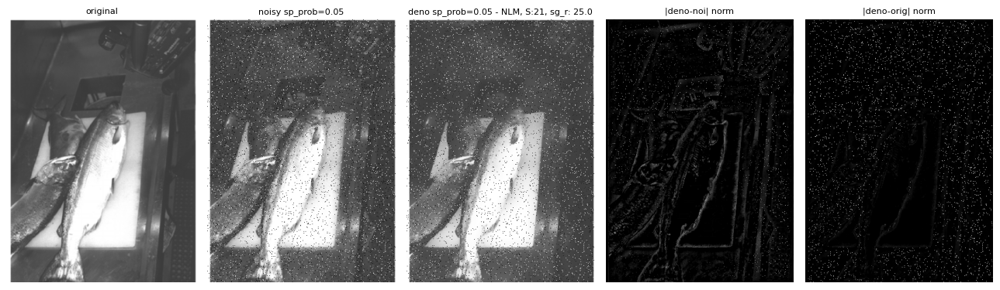

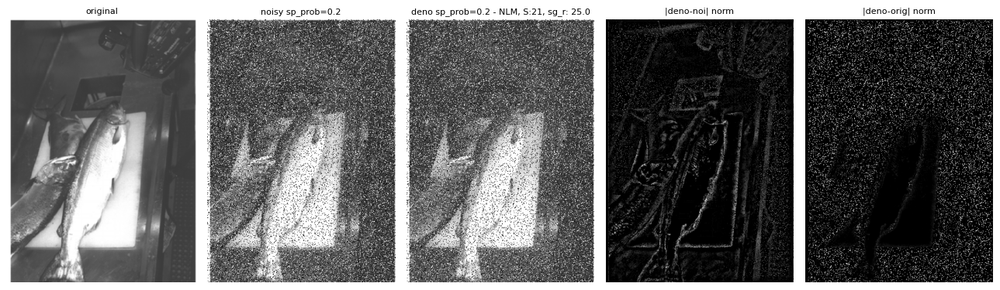

In [57]:
fishes_spnlm_dfs = []

for i in range(1,3):
  or_sp = sp_triplets[imgs_keys[1]][sp_triplets_keys[0]]
  n_sp = sp_triplets[imgs_keys[1]][sp_triplets_keys[i]]
  f_spnlm = nlm_sp_triplets[imgs_keys[1]][nlm_sp_out_keys[i]]
  fishes_spnlm_df = debug_effect(or_sp,
                                 n_sp,
                                 f_spnlm,
                                 title1=f"{sp_triplets_keys[i]}", title2= f"{nlm_sp_out_keys[i]}")

  fishes_spnlm_dfs.append(fishes_spnlm_df)

eye_spnlm_df = pd.concat(fishes_spnlm_dfs, ignore_index=True)

In [58]:
eye_spnlm_df

,original,filter,min_origianl,max_original,min_denoised,max_denoised,max_abs_diff,PSNR_noisy_vs_orig,PSNR_den_vs_orig,ΔPSNR,"SNR_db(noisy, orig)","SNR_db(den, orig)",ΔSNR(dB)
0,sp_prob=0.05,"sp_prob=0.05 - NLM, S:21, sg_r: 25.0",51.0,255.0,1.548868e-19,255.0,53.458069,17.941515,18.087942,0.146428,12.206897,12.319259,0.146428
1,sp_prob=0.2,"sp_prob=0.2 - NLM, S:21, sg_r: 25.0",51.0,255.0,4.434438e-20,255.0,32.367859,11.945753,12.036155,0.090401,6.786783,6.846335,0.090401


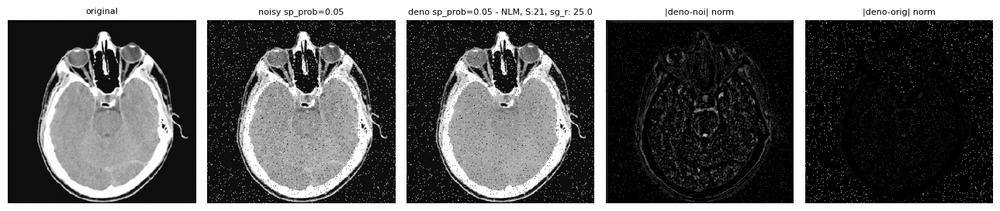

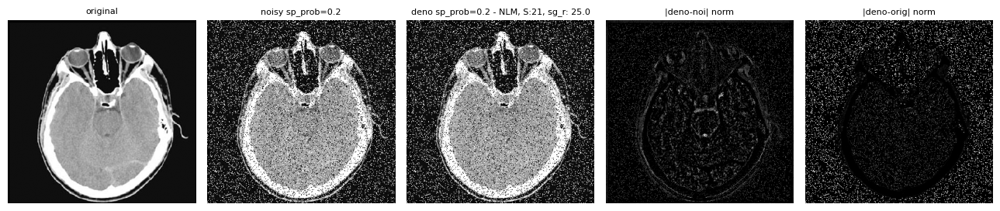

In [59]:
mri_spnlm_dfs = []

for i in range(1,3):
  or_sp = sp_triplets[imgs_keys[2]][sp_triplets_keys[0]]
  n_sp = sp_triplets[imgs_keys[2]][sp_triplets_keys[i]]
  f_spnlm = nlm_sp_triplets[imgs_keys[2]][nlm_sp_out_keys[i]]
  mri_spnlm_df = debug_effect(or_sp,
                                 n_sp,
                                 f_spnlm,
                                 title1=f"{sp_triplets_keys[i]}", title2= f"{nlm_sp_out_keys[i]}")

  mri_spnlm_dfs.append(mri_spnlm_df)

mri_spnlm_df = pd.concat(mri_spnlm_dfs, ignore_index=True)

In [60]:
mri_spnlm_df

,original,filter,min_origianl,max_original,min_denoised,max_denoised,max_abs_diff,PSNR_noisy_vs_orig,PSNR_den_vs_orig,ΔPSNR,"SNR_db(noisy, orig)","SNR_db(den, orig)",ΔSNR(dB)
0,sp_prob=0.05,"sp_prob=0.05 - NLM, S:21, sg_r: 25.0",0.0,255.0,7.476896e-07,255.0,40.253891,17.095237,17.131589,0.036352,11.059589,11.069112,0.036351
1,sp_prob=0.2,"sp_prob=0.2 - NLM, S:21, sg_r: 25.0",0.0,255.0,5.736931e-08,255.0,41.058121,11.106895,11.163449,0.056554,5.716984,5.755670,0.056554


## Comparativa Filtro NLM - Ruido Gaussiano

#### Manejo de Keys de resultados para análisis Filtro NLM - Ruido Gaussiano

In [61]:
nlm_gn_imgs_keys = list(nlm_gn_triplets.keys())
nlm_gn_out_keys =list(nlm_gn_triplets[nlm_gn_imgs_keys[0]].keys())

In [62]:
print(nlm_gn_imgs_keys)
print(nlm_gn_out_keys)

['eye', 'fishes', 'mri']
['original', 'gn_sigma=10.0 - NLM, S:21, sg_r: 25.0', 'gn_sigma=30.0 - NLM, S:21, sg_r: 25.0']


**Main dictionary**:

*"eye"* = nlm_gn_imgs_keys[0]

*"fish"* = nlm_gn_imgs_keys[1]

*"mri"* = nlm_gn_imgs_keys[2]



**Sub dictionary**:

*"original"* = nlm_gn_out_keys[0]

*"gn_sigma=10.0 - NLM, S:21, sg_r: 25.0"* = nlm_gn_out_keys[1]

*"gn_sigma=30.0 - NLM, S:21, sg_r: 25.0"* = nlm_gn_out_keys[2]

Entonces un llamado será:

nlm_sp_triplets[nlm_gn_imgs_keys[0]][nlm_gn_out_keys[1]] = bilat_gn_triplets["eye"]["gn_sigma=10.0 - NLM, S:21, sg_r: 25.0"]

#### Comparativa Filtro NLM - Gaussian Noise

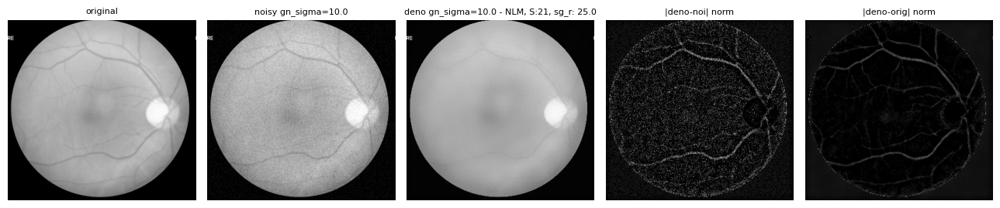

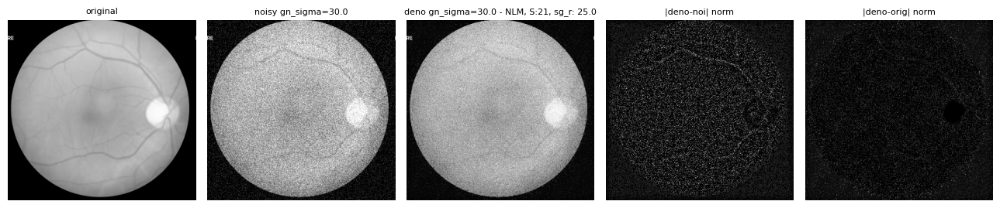

In [63]:
eye_gnnlm_dfs = []

for i in range(1,3):
  or_gn = gn_triplets[imgs_keys[0]][gn_triplets_keys[0]]
  n_gn = gn_triplets[imgs_keys[0]][gn_triplets_keys[i]]
  f_gnnlm = nlm_gn_triplets[imgs_keys[0]][nlm_gn_out_keys[i]]
  eye_gnnlm_df = debug_effect(or_gn,
                              n_gn,
                              f_gnnlm,
                              title1=f"{gn_triplets_keys[i]}", title2= f"{nlm_gn_out_keys[i]}")

  eye_gnnlm_dfs.append(eye_gnnlm_df)

eye_gnnlm_df = pd.concat(eye_gnnlm_dfs, ignore_index=True)

In [64]:
eye_gnnlm_df

,original,filter,min_origianl,max_original,min_denoised,max_denoised,max_abs_diff,PSNR_noisy_vs_orig,PSNR_den_vs_orig,ΔPSNR,"SNR_db(noisy, orig)","SNR_db(den, orig)",ΔSNR(dB)
0,gn_sigma=10.0,"gn_sigma=10.0 - NLM, S:21, sg_r: 25.0",0.0,251.0,0.587249,248.719925,38.768700,28.780727,34.906486,6.125760,24.106339,30.218582,6.125760
1,gn_sigma=30.0,"gn_sigma=30.0 - NLM, S:21, sg_r: 25.0",0.0,251.0,0.603193,247.649597,42.611534,19.290658,23.432819,4.142161,14.738677,18.788892,4.142161


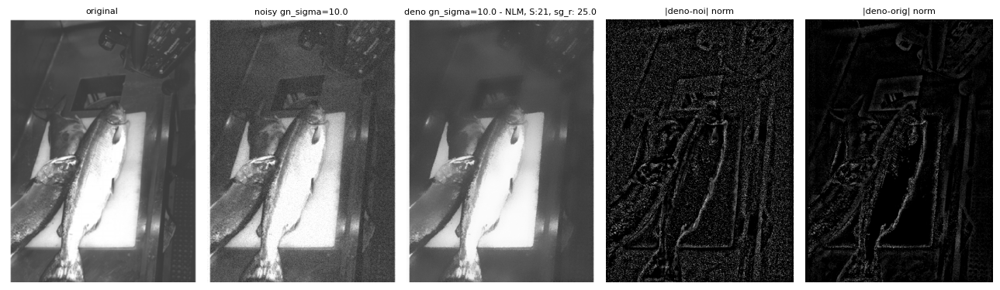

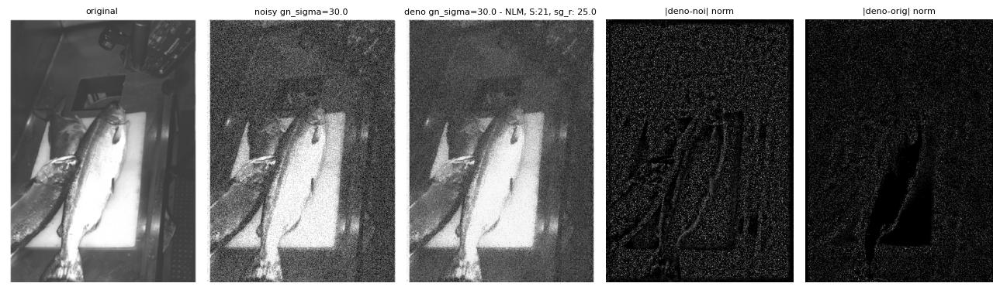

In [65]:
fishes_gnnlm_dfs = []

for i in range(1,3):
  or_gn = gn_triplets[imgs_keys[1]][gn_triplets_keys[0]]
  n_gn = gn_triplets[imgs_keys[1]][gn_triplets_keys[i]]
  f_gnnlm = nlm_gn_triplets[imgs_keys[1]][nlm_gn_out_keys[i]]
  fishes_gnnlm_df = debug_effect(or_gn,
                              n_gn,
                              f_gnnlm,
                              title1=f"{gn_triplets_keys[i]}", title2= f"{nlm_gn_out_keys[i]}")

  fishes_gnnlm_dfs.append(fishes_gnnlm_df)

fishes_gnnlm_df = pd.concat(fishes_gnnlm_dfs, ignore_index=True)

In [66]:
fishes_gnnlm_df

,original,filter,min_origianl,max_original,min_denoised,max_denoised,max_abs_diff,PSNR_noisy_vs_orig,PSNR_den_vs_orig,ΔPSNR,"SNR_db(noisy, orig)","SNR_db(den, orig)",ΔSNR(dB)
0,gn_sigma=10.0,"gn_sigma=10.0 - NLM, S:21, sg_r: 25.0",51.0,255.0,25.951345,253.174744,38.326534,28.352732,31.781102,3.428370,22.387223,25.763075,3.428370
1,gn_sigma=30.0,"gn_sigma=30.0 - NLM, S:21, sg_r: 25.0",51.0,255.0,2.793920,250.680786,45.147980,18.923718,22.197866,3.274147,13.022381,16.169370,3.274147


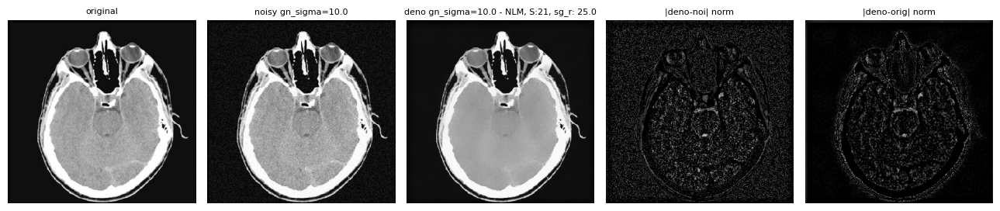

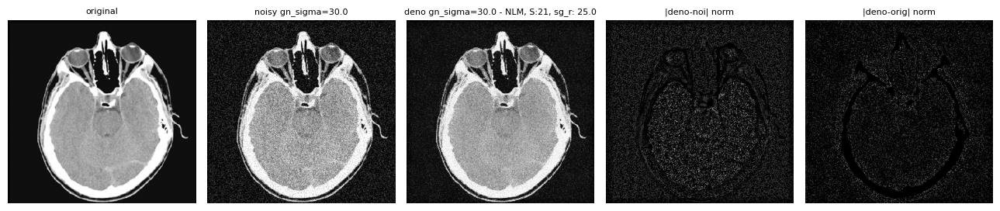

In [67]:
mri_gnnlm_dfs = []

for i in range(1,3):
  or_gn = gn_triplets[imgs_keys[2]][gn_triplets_keys[0]]
  n_gn = gn_triplets[imgs_keys[2]][gn_triplets_keys[i]]
  f_gnnlm = nlm_gn_triplets[imgs_keys[2]][nlm_gn_out_keys[i]]
  mri_gnnlm_df = debug_effect(or_gn,
                              n_gn,
                              f_gnnlm,
                              title1=f"{gn_triplets_keys[i]}", title2= f"{nlm_gn_out_keys[i]}")

  mri_gnnlm_dfs.append(mri_gnnlm_df)

mri_gnnlm_df = pd.concat(mri_gnnlm_dfs, ignore_index=True)

In [68]:
mri_gnnlm_df

,original,filter,min_origianl,max_original,min_denoised,max_denoised,max_abs_diff,PSNR_noisy_vs_orig,PSNR_den_vs_orig,ΔPSNR,"SNR_db(noisy, orig)","SNR_db(den, orig)",ΔSNR(dB)
0,gn_sigma=10.0,"gn_sigma=10.0 - NLM, S:21, sg_r: 25.0",0.0,255.0,1.951423,250.981308,40.319992,28.667524,31.461425,2.793901,22.379879,25.131465,2.793900
1,gn_sigma=30.0,"gn_sigma=30.0 - NLM, S:21, sg_r: 25.0",0.0,255.0,1.586472,249.089935,43.874725,19.977532,23.148087,3.170556,13.769627,16.822984,3.170555


 # 2. Para el Filtro Bilateral y el de Promedio No Local:

   a. Calibre los dos parámetros en las imágenes corruptas con ruido sal y pimienta y Gaussiano por separado para los 2 escenarios. Utilice $weights$ $and$ $biases$ u $optuna$ para tal $calibracion$. Reporte los mejores valores encontrados.

   b. Filtre las imágenes usando los parámetros encontrados y reporte los resultados. Mida el PSNR de todas las imágenes, y por cada tipo de ruido reporte el PSNR promedio.

   c. Mida el tiempo de ejecución para todas las imágenes y reporte el promedio.

   d. Compare los resultados cuantitativa y cualitativamente entre el filtro bilateral, el filtro de Promediado No Local y el Gaussiano.
  

# Calibración por medio de optuna

## Manejo de imagenes para calibración

### Filtro bilateral

Ruido Salt & Pepper

In [69]:
#Diccionario:


#img_sp_bi = {
#    "eye": {sp_triplets['eye']['original'],
#            sp_triplets['eye']['sp_prob=0.05'],
#            bilat_sp_triplets['eye']['sp_prob=0.05 - BI, N:21, sg_r: 25'],
#            sp_triplets['eye']['sp_prob=0.2'],
#            bilat_sp_triplets['eye']['sp_prob=0.2 - BI, N:21, sg_r: 25']},

#    "fishes": {sp_triplets['fishes']['original'],
#             sp_triplets['fishes']['sp_prob=0.05'],
#             bilat_sp_triplets['fishes']['sp_prob=0.05 - BI, N:21, sg_r: 25'],
#             sp_triplets['fishes']['sp_prob=0.2'],
#             bilat_sp_triplets['eye']['sp_prob=0.2 - BI, N:21, sg_r: 25']},

#    "mri": {sp_triplets['mri']['original'],
#            sp_triplets['mri']['sp_prob=0.05'],
#            bilat_sp_triplets['mri']['sp_prob=0.05 - BI, N:21, sg_r: 25'],
#            sp_triplets['mri']['sp_prob=0.2'],
#            bilat_sp_triplets['mri']['sp_prob=0.2 - BI, N:21, sg_r: 25']}
#}

In [70]:
imgs_sp_list = list(sp_triplets.keys())
bi_n_imgs_sp_list = list(sp_triplets['eye'].keys())
bi_dn_img_sp_list = list(bilat_sp_triplets['eye'].keys())

print(sp_triplets.keys())
print (sp_triplets['eye'].keys())
print(bilat_sp_triplets['eye'].keys())

dict_keys(['eye', 'fishes', 'mri'])
dict_keys(['original', 'sp_prob=0.05', 'sp_prob=0.2'])
dict_keys(['original', 'sp_prob=0.05 - BI, N:21, sg_r: 25', 'sp_prob=0.2 - BI, N:21, sg_r: 25'])


In [71]:
# --- SP + Bilateral ---
img_sp_bi = {}
for name in imgs_sp_list:   # ["eye", "fishes", "mri"]
    img_sp_bi[name] = {
        "original": sp_triplets[name][bi_n_imgs_sp_list[0]],                  # original
        bi_n_imgs_sp_list[1]: sp_triplets[name][bi_n_imgs_sp_list[1]],        # ruido sp_prob=0.05
        bi_dn_img_sp_list[0]: bilat_sp_triplets[name][bi_dn_img_sp_list[0]],  # filtrada sp_prob=0.05
        bi_n_imgs_sp_list[2]: sp_triplets[name][bi_n_imgs_sp_list[2]],        # ruido sp_prob=0.2
        bi_dn_img_sp_list[1]: bilat_sp_triplets[name][bi_dn_img_sp_list[1]],  # filtrada sp_prob=0.2
    }

Ruido Gaussiano

In [72]:
#img_gn_bi = {
#    "eye": {gn_triplets['eye']['original'],
#            gn_triplets['eye']['gn_sigma=10.0'],
#            bilat_gn_triplets['eye']['gn_sigma=10.0 - BI, N:21, sg_r: 25'],
#            gn_triplets['eye']['gn_sigma=30.0'],
#            bilat_gn_triplets['eye']['gn_sigma=30.0 - BI, N:21, sg_r: 25']},

#    "fishes": {gn_triplets['fishes']['original'],
#             gn_triplets['fishes']['gn_sigma=10.0'],
#             bilat_gn_triplets['fishes']['gn_sigma=10.0 - BI, N:21, sg_r: 25'],
#             gn_triplets['fishes']['gn_sigma=30.0'],
#             bilat_gn_triplets['eye']['gn_sigma=30.0 - BI, N:21, sg_r: 25']},

#    "mri": {gn_triplets['mri']['original'],
#            gn_triplets['mri']['gn_sigma=10.0'],
#            bilat_gn_triplets['mri']['gn_sigma=10.0 - BI, N:21, sg_r: 25'],
#            gn_triplets['mri']['gn_sigma=30.0'],
#            bilat_gn_triplets['mri']['gn_sigma=30.0 - BI, N:21, sg_r: 25']}
#}

In [73]:
imgs_gn_list = list(gn_triplets.keys())
bi_n_imgs_gn_list = list(gn_triplets['eye'].keys())
bi_dn_img_gn_list = list(bilat_gn_triplets['eye'].keys())

print(gn_triplets.keys())
print (gn_triplets['eye'].keys())
print(bilat_gn_triplets['eye'].keys())

dict_keys(['eye', 'fishes', 'mri'])
dict_keys(['original', 'gn_sigma=10.0', 'gn_sigma=30.0'])
dict_keys(['original', 'gn_sigma=10.0 - BI, N:21, sg_r: 25', 'gn_sigma=30.0 - BI, N:21, sg_r: 25'])


In [74]:
# --- GN + Bilateral ---
img_gn_bi = {}
for name in imgs_gn_list:
    img_gn_bi[name] = {
        "original": gn_triplets[name][bi_n_imgs_gn_list[0]],
        bi_n_imgs_gn_list[1]: gn_triplets[name][bi_n_imgs_gn_list[1]],        # gn_sigma=10.0
        bi_dn_img_gn_list[0]: bilat_gn_triplets[name][bi_dn_img_gn_list[0]],  # filtrada gn_sigma=10.0
        bi_n_imgs_gn_list[2]: gn_triplets[name][bi_n_imgs_gn_list[2]],        # gn_sigma=30.0
        bi_dn_img_gn_list[1]: bilat_gn_triplets[name][bi_dn_img_gn_list[1]],  # filtrada gn_sigma=30.0
    }

### Filtro NLM

Ruido Salt & Pepper

In [75]:
#img_sp_nlm = {
#    "eye": {sp_triplets['eye']['original'],
#            sp_triplets['eye']['sp_prob=0.05'],
#            nlm_sp_triplets['eye']['sp_prob=0.05 - NLM, S:21, sg_r: 25.0'],
#            sp_triplets['eye']['sp_prob=0.2'],
#            nlm_sp_triplets['eye']['sp_prob=0.2 - NLM, S:21, sg_r: 25.0']},

#    "fishes": {sp_triplets['fishes']['original'],
#             sp_triplets['fishes']['sp_prob=0.05'],
#             nlm_sp_triplets['fishes']['sp_prob=0.05 - NLM, S:21, sg_r: 25.0'],
#             sp_triplets['fishes']['sp_prob=0.2'],
#             nlm_sp_triplets['eye']['sp_prob=0.2 - NLM, S:21, sg_r: 25.0']},

#    "mri": {sp_triplets['mri']['original'],
#            sp_triplets['mri']['sp_prob=0.05'],
#            nlm_sp_triplets['mri']['sp_prob=0.05 - NLM, S:21, sg_r: 25.0'],
#            sp_triplets['mri']['sp_prob=0.2'],
#            nlm_sp_triplets['mri']['sp_prob=0.2 - NLM, S:21, sg_r: 25.0']}
#}

In [76]:
imgs_sp_list = list(sp_triplets.keys())
nlm_n_imgs_sp_list = list(sp_triplets['eye'].keys())
nlm_dn_img_sp_list = list(nlm_sp_triplets['eye'].keys())

print(sp_triplets.keys())
print (sp_triplets['eye'].keys())
print(nlm_sp_triplets['eye'].keys())

dict_keys(['eye', 'fishes', 'mri'])
dict_keys(['original', 'sp_prob=0.05', 'sp_prob=0.2'])
dict_keys(['original', 'sp_prob=0.05 - NLM, S:21, sg_r: 25.0', 'sp_prob=0.2 - NLM, S:21, sg_r: 25.0'])


In [77]:
# --- SP + NLM ---
img_sp_nlm = {}
for name in imgs_sp_list:
    img_sp_nlm[name] = {
        "original": sp_triplets[name][nlm_n_imgs_sp_list[0]],
        nlm_n_imgs_sp_list[1]: sp_triplets[name][nlm_n_imgs_sp_list[1]],        # sp_prob=0.05
        nlm_dn_img_sp_list[0]: nlm_sp_triplets[name][nlm_dn_img_sp_list[0]],    # filtrada sp_prob=0.05
        nlm_n_imgs_sp_list[2]: sp_triplets[name][nlm_n_imgs_sp_list[2]],        # sp_prob=0.2
        nlm_dn_img_sp_list[1]: nlm_sp_triplets[name][nlm_dn_img_sp_list[1]],    # filtrada sp_prob=0.2
    }

Rudo Gaussiano

In [78]:
#img_gn_nlm = {
#    "eye": {gn_triplets['eye']['original'],
#            gn_triplets['eye']['gn_sigma=10.0'],
#            nlm_gn_triplets['eye']['gn_sigma=10.0 - NLM, S:21, sg_r: 25.0'],
#            gn_triplets['eye']['gn_sigma=30.0'],
#            nlm_gn_triplets['eye']['gn_sigma=30.0 - NLM, S:21, sg_r: 25.0']},

#    "fishes":{gn_triplets['fishes']['original'],
#             gn_triplets['fishes']['gn_sigma=10.0'],
#             nlm_gn_triplets['fishes']['gn_sigma=10.0 - NLM, S:21, sg_r: 25.0'],
#             gn_triplets['fishes']['gn_sigma=30.0'],
#             nlm_gn_triplets['eye']['gn_sigma=30.0 - NLM, S:21, sg_r: 25.0']},

#    "mri": {gn_triplets['mri']['original'],
#            gn_triplets['mri']['gn_sigma=10.0'],
#            nlm_gn_triplets['mri']['gn_sigma=10.0 - NLM, S:21, sg_r: 25.0'],
#            gn_triplets['mri']['gn_sigma=30.0'],
#            nlm_gn_triplets['mri']['gn_sigma=30.0 - NLM, S:21, sg_r: 25.0']}
#}

In [79]:
imgs_gn_list = list(gn_triplets.keys())
nlm_n_imgs_gn_list = list(gn_triplets['eye'].keys())
nlm_dn_img_gn_list = list(nlm_gn_triplets['eye'].keys())

print(gn_triplets.keys())
print (gn_triplets['eye'].keys())
print(nlm_gn_triplets['eye'].keys())

dict_keys(['eye', 'fishes', 'mri'])
dict_keys(['original', 'gn_sigma=10.0', 'gn_sigma=30.0'])
dict_keys(['original', 'gn_sigma=10.0 - NLM, S:21, sg_r: 25.0', 'gn_sigma=30.0 - NLM, S:21, sg_r: 25.0'])


In [80]:
img_gn_nlm = {}

for name in imgs_gn_list:  # recorre 'eye','fishes','mri'
    img_gn_nlm[name] = {
        "original": gn_triplets[name][nlm_n_imgs_gn_list[0]],          # original
        nlm_n_imgs_gn_list[1]: gn_triplets[name][nlm_n_imgs_gn_list[1]],  # gn_sigma=10.0
        nlm_dn_img_gn_list[1]: nlm_gn_triplets[name][nlm_dn_img_gn_list[1]],  # filtrada σ=10.0
        nlm_n_imgs_gn_list[2]: gn_triplets[name][nlm_n_imgs_gn_list[2]],  # gn_sigma=30.0
        nlm_dn_img_gn_list[2]: nlm_gn_triplets[name][nlm_dn_img_gn_list[2]],  # filtrada σ=30.0
    }

## Fuciones utiles

In [81]:
# --- nombres que generan apply_* (sin modificar tus funciones) ---
def bi_out_key(noise_key: str, N: int, sigma_r: float) -> str:
    return f"{noise_key} - BI, N:{N}, sg_r: {sigma_r}"

def nlm_out_key(noise_key: str, S: int, sigma_r: float) -> str:
    return f"{noise_key} - NLM, S:{S}, sg_r: {sigma_r}"

def move_to_device(d, device):
    out = {}
    for n, trip in d.items():
        out[n] = {k: (v.to(device, non_blocking=True) if isinstance(v, torch.Tensor) else v)
                  for k, v in trip.items()}
    return out

In [82]:
def downsample_triplets(nested_dict: dict, scale=0.5):
    """Crea versiones reducidas (para tuning rápido). Usa al final best params en full-res."""
    out = {}
    for name, trip in nested_dict.items():
        out[name] = {}
        for k, img in trip.items():
            if not isinstance(img, torch.Tensor):
                out[name][k] = img
                continue
            x = img.float().unsqueeze(0).unsqueeze(0)  # [1,1,H,W]
            H, W = x.shape[-2:]
            H2, W2 = max(1, int(H*scale)), max(1, int(W*scale))
            x_small = F.interpolate(x, size=(H2, W2), mode="area").squeeze(0).squeeze(0)
            out[name][k] = x_small
    return out


## Funciones evaludadoras:

In [83]:
def evaluate_bilateral_psnr(base_triplets: dict, noise_key: str, N: int, sigma_r: float) -> float:
    bi_dict = apply_bilateral(base_triplets, N=N, sigma_r=sigma_r, sigma_r_rel=False)
    outk = bi_out_key(noise_key, N, sigma_r)
    scores = []
    for name, trip in base_triplets.items():
        if "original" not in trip:
            raise KeyError(f"Falta 'original' en {name}")
        if outk not in bi_dict[name]:
            # Ayuda de debug si la clave no coincide
            avail = list(bi_dict[name].keys())
            raise KeyError(f"[{name}] No existe clave '{outk}'. Disponibles: {avail[:6]} ...")
        orig = trip["original"]
        den  = bi_dict[name][outk]
        scores.append(psnr(orig, den))
    return float(sum(scores)/len(scores))

In [84]:
def evaluate_nlm_psnr(base_triplets: dict, noise_key: str, S: int, sigma_r: float) -> float:
    nlm_dict = apply_nlm(base_triplets, S=S, sigma_r=sigma_r, sigma_r_rel=False)
    outk = nlm_out_key(noise_key, S, sigma_r)
    scores = []
    for name, trip in base_triplets.items():
        if "original" not in trip:
            raise KeyError(f"Falta 'original' en {name}")
        if outk not in nlm_dict[name]:
            avail = list(nlm_dict[name].keys())
            raise KeyError(f"[{name}] No existe clave '{outk}'. Disponibles: {avail[:6]} ...")
        orig = trip["original"]
        den  = nlm_dict[name][outk]
        scores.append(psnr(orig, den))
    return float(sum(scores)/len(scores))

In [85]:
def objective(trial: optuna.Trial, filtro: str, base_triplets: dict, noise_key: str,
              wandb_log: bool = True,
              per_trial_sec: int = 180):
    t0 = time.time()
    if filtro == "bilateral":
        # Reducimos un poco espacio para acelerar (puedes ampliar luego)
        N = trial.suggest_int("N", 3, 15, step=2)          # impar
        sigma_r = trial.suggest_float("sigma_r", 5.0, 60.0)
        score = evaluate_bilateral_psnr(base_triplets, noise_key, N, sigma_r)
        if wandb_log:
            wandb.log({"trial": trial.number, "filtro": "bilateral", "noise_key": noise_key,
                       "N": N, "sigma_r": sigma_r, "PSNR": score})
    elif filtro == "nlm":
        S = trial.suggest_int("S", 7, 19, step=2)          # impar
        sigma_r = trial.suggest_float("sigma_r", 5.0, 60.0)
        score = evaluate_nlm_psnr(base_triplets, noise_key, S, sigma_r)
        if wandb_log:
            wandb.log({"trial": trial.number, "filtro": "nlm", "noise_key": noise_key,
                       "S": S, "sigma_r": sigma_r, "PSNR": score})
    else:
        raise ValueError(f"Filtro desconocido: {filtro}")

    # Timeout por trial
    if time.time() - t0 > per_trial_sec:
        raise optuna.exceptions.TrialPruned()
    return score

In [86]:
def run_study(filtro: str,
              base_triplets: dict,
              noise_key: str,
              n_trials: int = 30,
              study_name: str | None = None,
              per_trial_sec: int = 180,
              show_progress_bar: bool = True):
    # Pruner: corta trials flojos rápido
    pruner = optuna.pruners.MedianPruner(n_startup_trials=5, n_warmup_steps=0)
    study = optuna.create_study(direction="maximize", pruner=pruner, study_name=study_name or f"{filtro}_{noise_key}")

    # Wrapper para añadir timeout por trial y barra de progreso
    def _obj(trial):
        return objective(trial, filtro, base_triplets, noise_key,
                         wandb_log=True, per_trial_sec=per_trial_sec)

    study.optimize(_obj, n_trials=n_trials, show_progress_bar=show_progress_bar)

    # Limpieza de memoria entre estudios
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return study

In [87]:
def tune_with_optuna_and_wandb(base_triplets: dict,
                               noise_keys: list,
                               filtro: str,
                               n_trials: int = 30,
                               wandb_project: str = "TP1-tuning",
                               wandb_entity: str | None = None,
                               group_name: str | None = None,
                               per_trial_sec: int = 180,
                               run_name_prefix: str | None = None):
    rows = []
    for nk in noise_keys:
        # run hijo en W&B para este estudio
        run = wandb.init(
            project=wandb_project,
            entity=wandb_entity,
            group=group_name or filtro.upper(),
            job_type=f"optuna_{filtro}",
            name=(run_name_prefix or filtro.upper()) + f"_{nk}_{datetime.now().strftime('%H%M%S')}",
            config={"filtro": filtro, "noise_key": nk, "n_trials": n_trials, "per_trial_sec": per_trial_sec},
            reinit=True
        )

        study = run_study(filtro=filtro,
                          base_triplets=base_triplets,
                          noise_key=nk,
                          n_trials=n_trials,
                          study_name=f"{filtro.upper()}_{nk}",
                          per_trial_sec=per_trial_sec,
                          show_progress_bar=True)

        # log del mejor
        best = {"noise_key": nk, "filter": filtro.capitalize(), "best_score_PSNR": study.best_value} | study.best_params
        wandb.summary["best_score_PSNR"] = study.best_value
        for k, v in study.best_params.items():
            wandb.summary[f"best_{k}"] = v

        rows.append(best)
        wandb.finish()

    df = pd.DataFrame(rows)
    # ordenar columnas
    for c in ["N", "S", "sigma_r"]:
        if c not in df.columns:
            df[c] = pd.NA
    df = df[["noise_key", "filter", "N", "S", "sigma_r", "best_score_PSNR"]]
    return df

## Run marestro de optuna:

In [88]:
sp_triplets_small = downsample_triplets(sp_triplets, scale=0.5)
gn_triplets_small = downsample_triplets(gn_triplets, scale=0.5)

In [89]:
noisy_sp_img = list(sp_triplets['eye'].keys())
noisy_gn_img = list(gn_triplets['eye'].keys())
SP_NOISE_KEYS = [noisy_sp_img[1],noisy_sp_img[2]]#["sp_prob=0.05","sp_prob=0.2"]
GN_NOISE_KEYS = [noisy_gn_img[1],noisy_gn_img[2]]#["gn_sigma=10.0","gn_sigma=30.0"]

In [90]:
sp_triplets_small = move_to_device(sp_triplets, device)
gn_triplets_small = move_to_device(gn_triplets, device)

In [91]:
os.environ["WANDB_API_KEY"] = "b4c9bd8fe58a11ee483af5b1d78d5e7b21c056ca"
wandb.login()


/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: Currently logged in as: andress5990 (andress5990-tecnologico-de-costa-rica) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [92]:
os.environ["WANDB_MODE"] = "offline"
wandb.finish()

In [ ]:

wandb.finish()
wandb_master = wandb.init(
    project="TP1-Filtros-No-Lineales",
    job_type="calibracion",
    config={
        "filtros": ["bilateral", "nlm"],
        "escenarios_ruido": ["SP(0.05,0.2)", "GN(10,30)"],
        "n_trials_por_estudio": 30,
        "device": str(device),
        "downsample": True  # pon True si usaste *_small
    },
    name=f"MASTER_{datetime.now().strftime('%Y%m%d_%H%M%S')}",
    reinit=True
)

In [ ]:
df_sp_bi  = tune_with_optuna_and_wandb(sp_triplets_small, SP_NOISE_KEYS, filtro="bilateral",
                                       n_trials=30, group_name="SP", per_trial_sec=180,
                                       run_name_prefix="SP_BI")

In [ ]:
df_sp_nlm = tune_with_optuna_and_wandb(sp_triplets_small, SP_NOISE_KEYS, filtro="nlm",
                                       n_trials=30, group_name="SP", per_trial_sec=180,
                                       run_name_prefix="SP_NLM")

In [ ]:
df_gn_bi  = tune_with_optuna_and_wandb(gn_triplets_small, GN_NOISE_KEYS, filtro="bilateral",
                                       n_trials=30, group_name="GN", per_trial_sec=180,
                                       run_name_prefix="GN_BI")

In [ ]:
df_gn_nlm = tune_with_optuna_and_wandb(gn_triplets_small, GN_NOISE_KEYS, filtro="nlm",
                                       n_trials=30, group_name="GN", per_trial_sec=180,
                                       run_name_prefix="GN_NLM")

In [ ]:
df_all = pd.concat([df_sp_bi, df_sp_nlm, df_gn_bi, df_gn_nlm], ignore_index=True)
wandb.log({"tabla_mejores_parametros": wandb.Table(dataframe=df_all)})
wandb_master.finish()

In [ ]:
print(df_all)